# data augmentation


데이터를 증가시킨다. 뻥튀기한다. 

데이터의 수집이 어려운 경우에 사용한다.

기존 데이터를 재사용하는 과정에서 반복의 횟수를 늘려서 학습한다. 기존 데이터에 대한 반복적인 학습으로 인해 과적합이 발생합니다.

기존 데이터에 대해서 약간의 변형을 통해 마치 새로운 이미지를 학습하는 것과 같은 효과로 데이터의 크기를 늘립니다.



## 첫번째 방법 - ImageDataGenerator

```python 
    tf.keras.preprocessing.image.ImageDataGenerator(
        featurewise_center=False, samplewise_center=False,
        featurewise_std_normalization=False, samplewise_std_normalization=False,
        zca_whitening=False, zca_epsilon=1e-06, 
        rotation_range=0, 
        width_shift_range=0.0,
        height_shift_range=0.0, 
        brightness_range=None, shear_range=0.0, 
        zoom_range=0.0,
        channel_shift_range=0.0, fill_mode='nearest', cval=0.0,
        horizontal_flip=False, 
        vertical_flip=False, 
        rescale=None,
        preprocessing_function=None, data_format=None, validation_split=0.0, dtype=None
    )
```

### 장점

- 데이터 파이프라인 구축시, 필요한 이미지 전처리 과정을 인자의 추가만으로도 구현이 가능하다.
- 데이터의 무작위 처리를 통해 무한으로 데이터를 만들 수 있다.


### 단점

- tf.data.Dataset의 경우, .map() 사용자 정의 함수로 전처리과정을 커스터마이징 할 수 있다. 하지만 ImageDataGenerator의 경우, 기존에 구현해놓은 기능만 사용이 가능하다.

### 사용할 수 있는 이미지 처리


- width_shift_range

    이미지가 좌우로 약간씩 움직이게 한다. -> 얼마나 움직이게 할 것인가가 인자가 된다.

- height_shift_range

    이미지가 위아래로 약간씩 움직이게 한다. -> 얼마나 움직이게 할 것인가가 인자가 된다.


- fill_mode


- horizental_flip

    이미지를 랜덤하게 수평으로 뒤집는다.

- vertical_flip

    이미지를 랜덤하게 수직으로 뒤집는다.
    
    
- rotation_range

    이미지를 랜덤하게 회전시킨다. 얼마나 회전시킬 것인가가 인자가 된다.

- brightness_range

    이미지를 랜덤하게 밝기를 조절시킨다. 얼마나 밝게, 어둡게할 것인가가 인자가 된다.
    
- zoom_range

    이미지를 랜덤하게 확대, 축소 시킨다. 얼마나 확대, 축소할 것인가가 인자가 된다.
    
- rescale

    0-1사이의 데이터로 변환하기 위해 픽셀값을 나누는 작업




In [1]:
from numpy import expand_dims
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt

In [12]:
# 기준이미지 정하자.

img = load_img('./dataset/pets/Cat/10445.jpg')

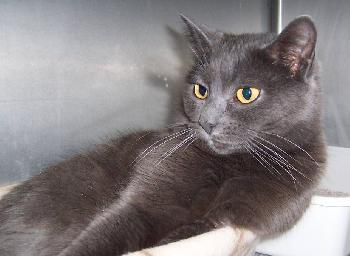

In [13]:
img

In [5]:
# batch의 형태로 변환 시켜줘야 한다.
# PIL -> array
data = img_to_array(img)

data.shape

(256, 350, 3)

In [6]:
# 첫번째 차원을 하나 추가한다.
samples  = expand_dims(data, 0)

In [8]:
# batch_size가 1인 batch를 하나 만들었다.
samples.shape

(1, 256, 350, 3)

In [14]:
# ImageDataGenerator하나 만들기

datagen = ImageDataGenerator(
    # 좌로 50%만큼 우로 50%만큼 랜덤하게 이동시키겠다.
    width_shift_range = [-50, 50],
    fill_mode = 'constant'
)

In [10]:
# 데이터 제네레이터가 만드는 이미지를 확인하기 위한 함수 -> 코드 재사용하기 위함.

def show_datagen(datagen):
    
    # datagenerator에서 데이터를 하나씩 로드하는 함수
    iterator = datagen.flow(samples, batch_size = 1)
    
    # batch 크기만큼 데이터를 불러옵니다.
    batch = iterator.next()
    
    # 보여줄 이미지들의 크기 정의
    fig = plt.figure(figsize = (30, 30))
    
    # 이미지를 보여준다.
    for i in range(9):
        # 한번에 여러 이미지를 보여줄 때 사용
        plt.subplot(3, 3, i + 1)
        
        # 배치 크기만큼 데이터를 불러옵니다.
        batch = iterator.next()
        
        # 0-255의 값을 가지는 행렬이기 때문에 이 행렬을 이미지로 인식하기 위해서는 type을 변환 시켜줘야한다.
        # 참고로, 0-1의 값을 가지는 행렬은 np.float32를 가져야한다.
        image = batch[0].astype('uint8')
        plt.imshow(image)

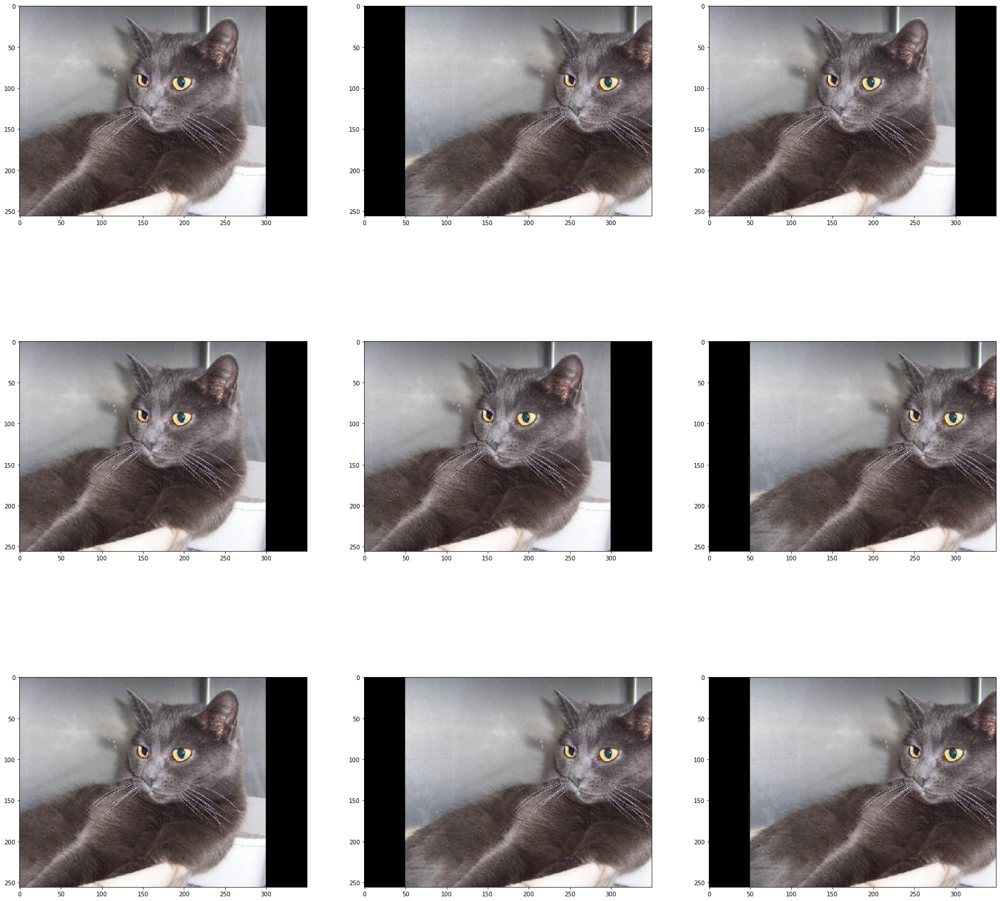

In [15]:
show_datagen(datagen)

In [16]:
# ImageDataGenerator하나 만들기

datagen = ImageDataGenerator(
    # 좌로 50%만큼 우로 50%만큼 랜덤하게 이동시키겠다.
    height_shift_range = [-50, 50],
    fill_mode = 'constant'
)

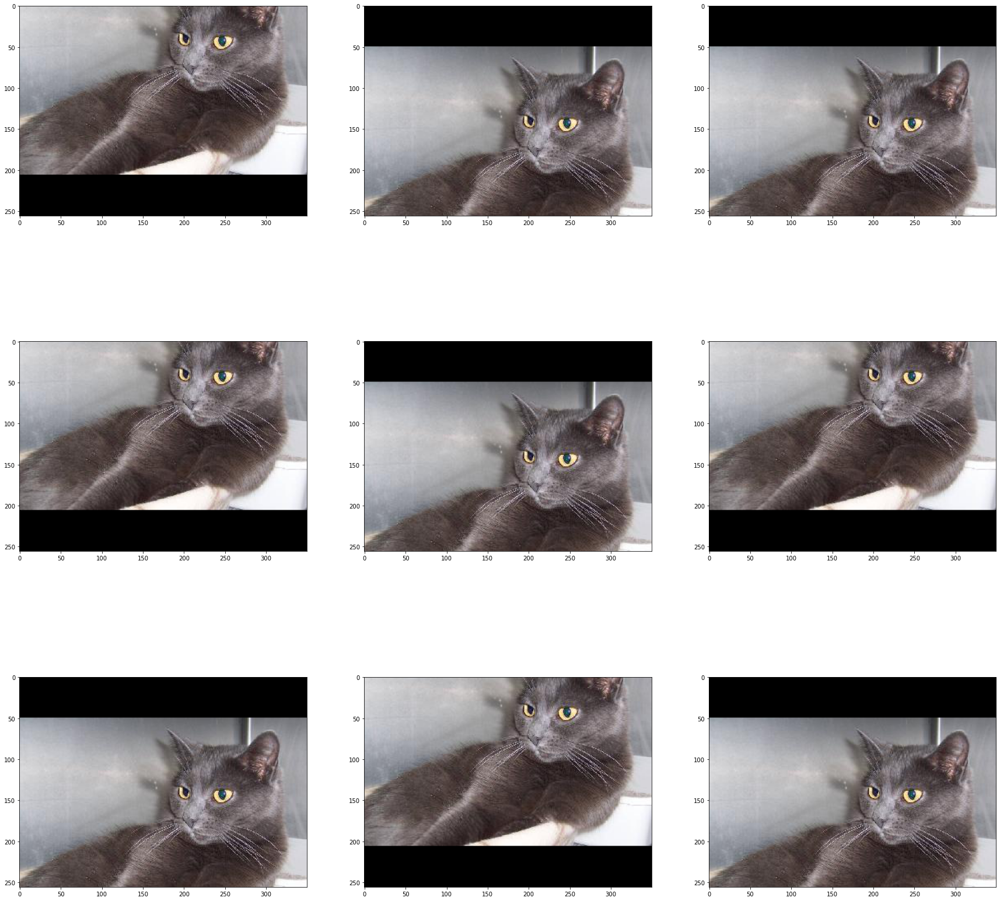

In [17]:
show_datagen(datagen)

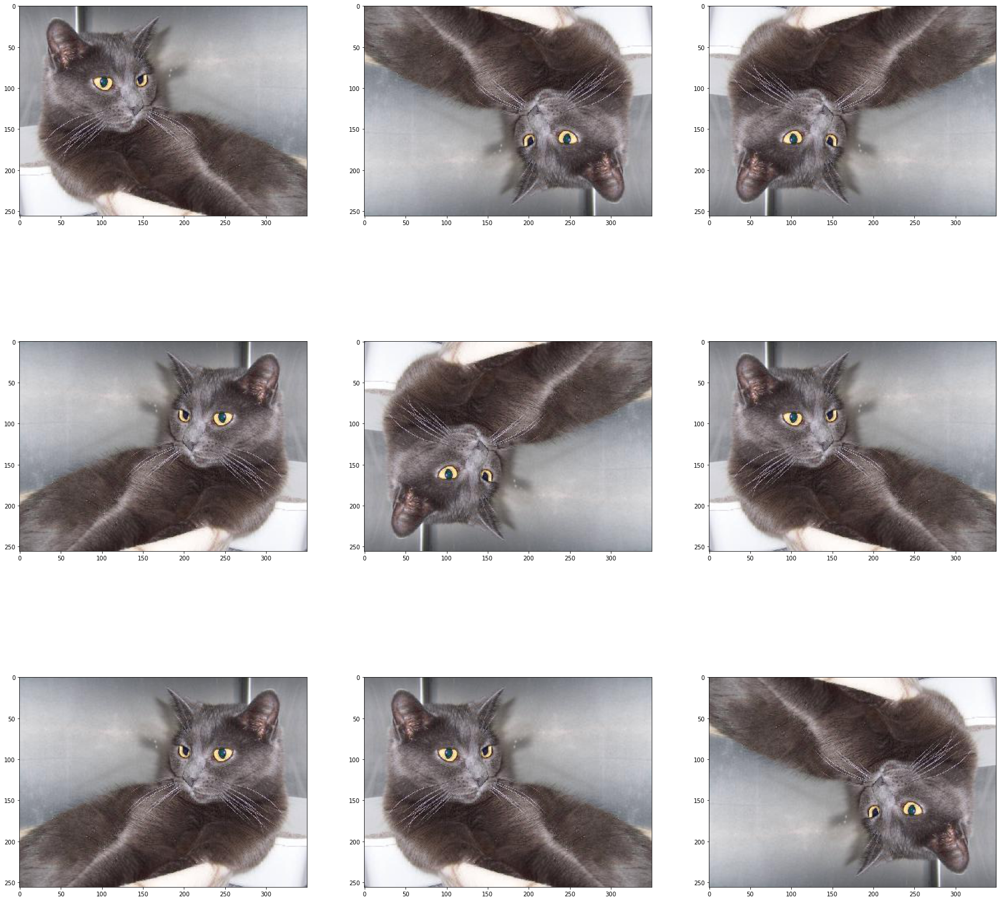

In [21]:
# 상하, 좌우로 뒤집는 데이터 생성 
datagen = ImageDataGenerator(
    # 좌로 50%만큼 우로 50%만큼 랜덤하게 이동시키겠다.
    horizontal_flip = True,
    vertical_flip = True,
    fill_mode = 'constant'
)

show_datagen(datagen)

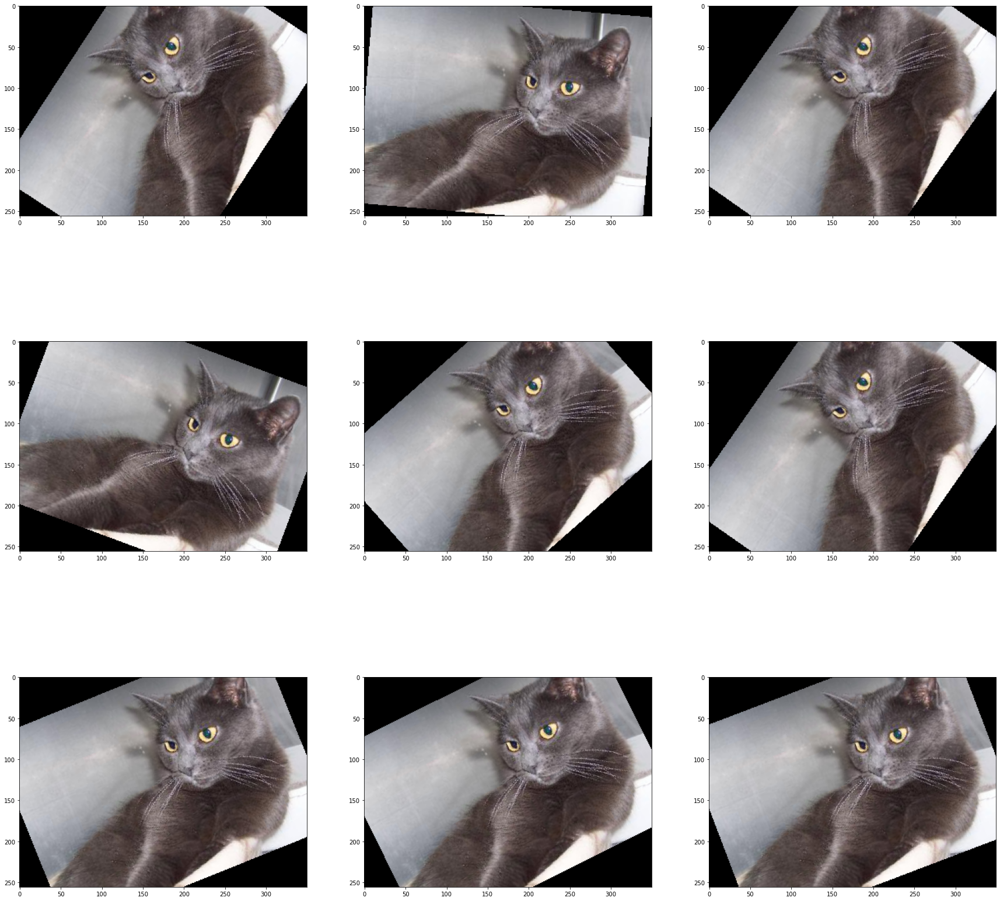

In [30]:
# 회전으로 데이터 생성
datagen = ImageDataGenerator(
    # -60도에서부터 60도까지의 회전이 랜덤하게 발생한 데이터 생성
    rotation_range = 60,
    fill_mode = 'constant'
)

show_datagen(datagen)

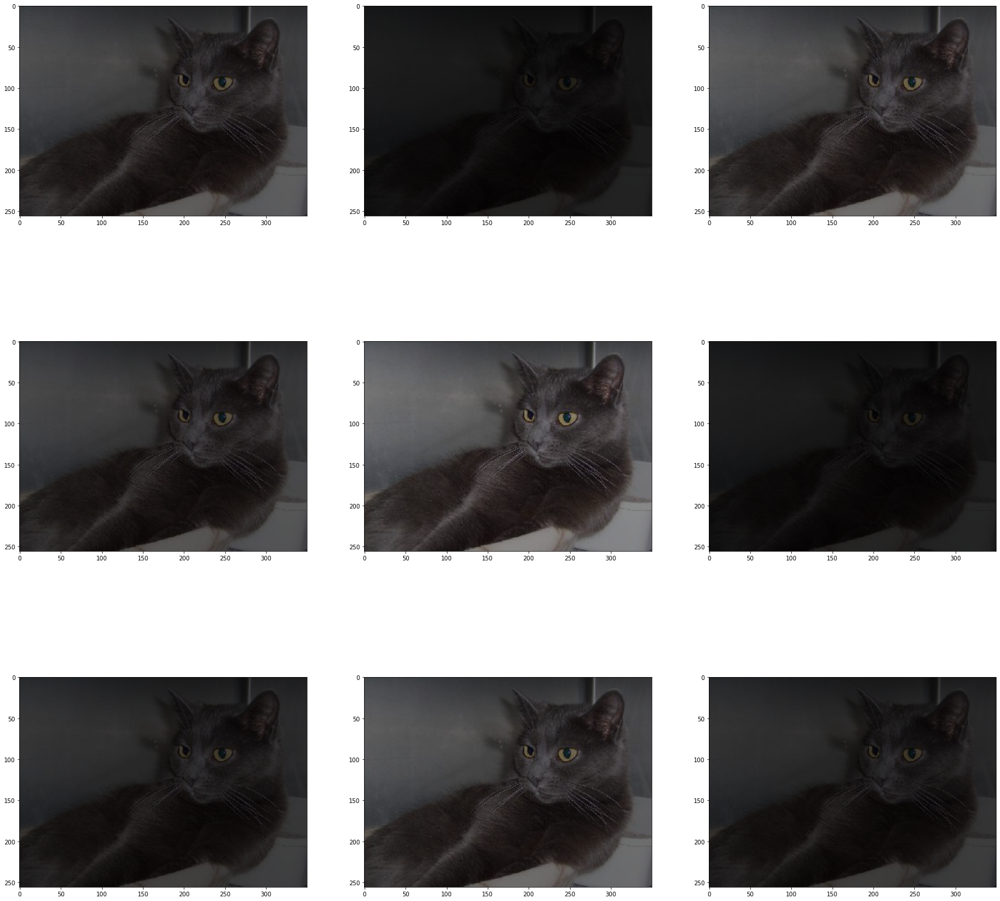

In [34]:
# 밝기 조절을 통한 새로운 데이터 생성
datagen = ImageDataGenerator(
    # 10%의 밝기 ~ 60%의 밝기를 가지는 이미지 생성
    brightness_range= (0.1, 0.6),
    fill_mode = 'constant'
)

show_datagen(datagen)

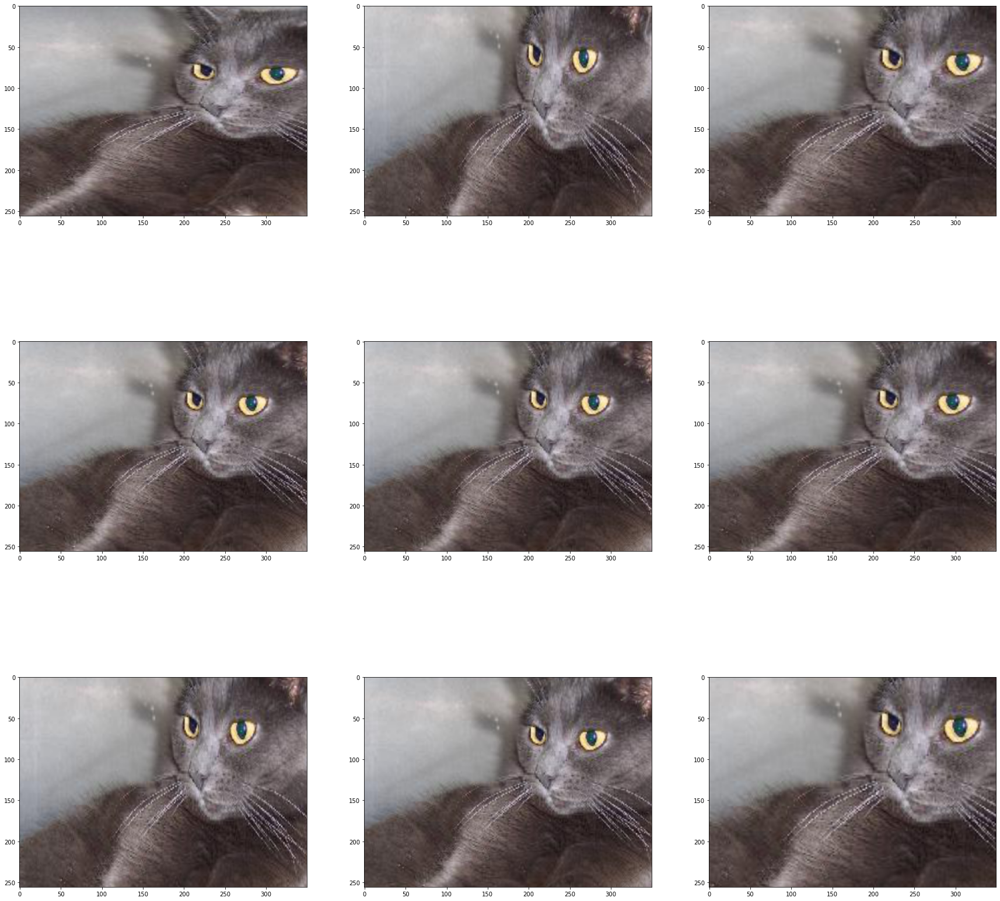

In [38]:
# 확대 조절을 통한 새로운 데이터 생성
datagen = ImageDataGenerator(
    # 소수점의 값이 낮을 수록 더 많이 확대된다.
    # 50%의 이미지 ~ 80%의 이미지까지 데이터를 생성한다.
    zoom_range = (0.5, 0.8),
    fill_mode = 'constant'
)

show_datagen(datagen)

# 위의 기능을 종합한 실제 데이터셋에 적용

In [40]:
datagen = ImageDataGenerator(
    
    zoom_range = [0.8, 1.0],
    height_shift_range = 0.2,
    rotation_range = 60,
    
)


In [41]:
# 기존 이미지 디렉토리를 연결
# 전처리를 수행하는 ImageDataGenerator -> flow_from_directory() -> 이미지 파일
train_dataset = datagen.flow_from_directory(
    './dataset/pets/',
    class_mode = 'binary',
    batch_size = 50
)

Found 23422 images belonging to 2 classes.


In [43]:
# 이미지 데이터를 파일에서 로드 -> 데이터를 생성 -> x_batch, y_batch로 넣는다.
for images , labels in train_dataset:
    print(images.shape)
    

(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 

(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(22, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 

(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(22, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 

(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)
(50, 256, 256, 3)


KeyboardInterrupt: 

# 두 번째 방법 - 전처리 과정을 레이어로 구현하기


## 장점


레이어로 구현하게 되면, 모델에 추가하여 함께 저장할 수 있다. 즉, 해당 모델을 재사용하는 시점에 또 다시 전처리과정을 구현할 필요가 없다.


## 단점

전처리 과정이 추가된 모델을 불러올경우, 새로운 전처리과정을 추가하고자할 때, 기존의 전처리 레이어를 제거하는 과정을 거쳐야만한다.


## tf.keras.layers.experimental.preprocessing

전처리를 위한 여러가지 연산들을 미리 layer로 만들어두었다. 모든 layer에 이름이 있다는 사실..

https://www.tensorflow.org/api_docs/python/tf/keras/layers/experimental/preprocessing/?hl=ko


### 사용할 수 있는 전처리 레이어

#### 1. Resizing

```python
    tf.keras.layers.experimental.preprocessing.Resizing(
        height, width, interpolation='bilinear', name=None
    )
 ```
 
 - height는 해당 레이어의 결과 이미지의 높이
 - width는 해당 레이어의 결과 이미지의 너비
 - interpolation은 리사이징을 수행할 때, 픽셀 변환시의 연산 방식 정의
     
         
#### 2. Rescaling

0-255 -> 0 - 1 데이터로 변환하는 작업


#### 3. RandomTranslation
    
```python
    tf.keras.layers.experimental.preprocessing.RandomTranslation(
        height_factor, width_factor, fill_mode='reflect',
        interpolation='bilinear', seed=None, name=None, fill_value=0.0,
    )
```

- height_factor
    얼마나 위아래로 변화시킬 것인가
    
    
- width_factor
    얼마나 좌우로 변화시킬 것인가
        
        
#### 4. RandomFlip

```python
    tf.keras.layers.experimental.preprocessing.RandomFlip(
        mode=HORIZONTAL_AND_VERTICAL, seed=None, name=None
    )
```
   
#### 5. RandomHeight / RandomWidth
   
    

#### 6. RandomZoom

In [45]:
# tf.data.Dataset 
import tensorflow as tf
# 디렉토리 상의 이미지  tf.data.Dataset을 통해 데이터 파이프라인을 구축하는 방법
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    './dataset/pets',
    label_mode = 'binary',
    batch_size = 50
)

Found 23422 files belonging to 2 classes.


In [48]:
# 전처리 과정을 수행하는 레이어

preprocessing_layer = tf.keras.Sequential([
    # 필요한 전처리 과정을 수행하는 레이어
    tf.keras.layers.experimental.preprocessing.Resizing(225, 225),
    tf.keras.layers.experimental.preprocessing.RandomFlip(), 
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.3),
    tf.keras.layers.experimental.preprocessing.RandomHeight(0.5)
])

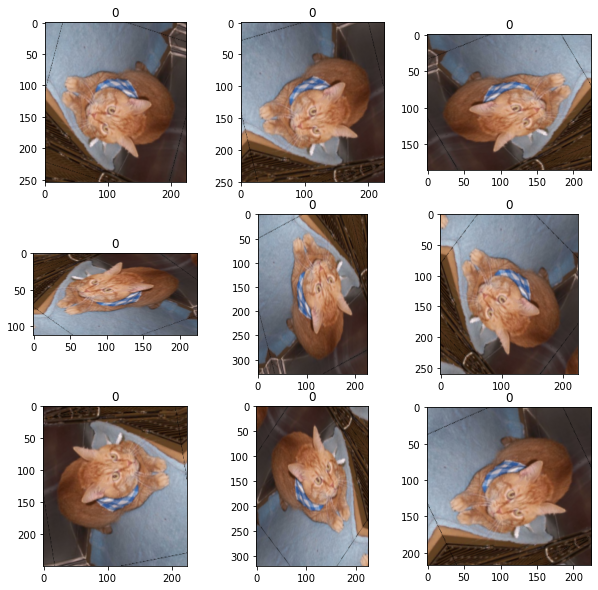

In [54]:
# 해당 레이어를 거친 결과 값을 확인해보자.

import numpy as np

#  tf.data.Dataset이 가지고 있는 이미지를 확인하고자 한다.
for images, labels in train_dataset.take(1):
    # 이미지를 어느정도 크기로 보여줄 것인가
    plt.figure(figsize = (10, 10))
    
    # 한개의 이미지를 들고오자.
    first_image = images[0]
    
    # 총 9번 전처리를 거친뒤 보여줄 것이다.
    for i in range(9):
        # 이미지를 가로로 3개씩, 세로로 3줄만큼 보여주겠다.
        ax = plt.subplot(3, 3, i+1)
        
        # first_image를 전처리 레이어를 거친 이미지를 반환
        after_image = preprocessing_layer(
            tf.expand_dims(first_image, 0), training = True
        )
        
        # after_image는 우리가 만든 전처리 레이어를 거친 이미지
        plt.imshow(after_image[0].numpy() / 255.)
        # 해당 이미지의 개, 고양이인가를 이미지 타이틀로 함께 보여준다.
        plt.title(int(labels[0]))
        
        
        
    